# Dviračių dalinimasis: oro temperatūros poveikis nuomos kiekiui ir jo pokyčio prognozavimas

*KCS duomenų analitikos kurso baigimasis darbas. Atliko R. Rekešius*

### 1. Duomenys ir jų vizualizacija Tableau

Darbe nagrinėjau iš **Kaggle.com** paimtą JAV Vašingtono miesto dviračių dalijimosi (nuomos) statistikos duomenų failą: __*Bike Sharing in Washington D.C. Dataset*__, adresas internete: [https://www.kaggle.com/marklvl/bike-sharing-dataset](https://www.kaggle.com/marklvl/bike-sharing-dataset)

Analizėje naudojami duomenys apima 2011 ir 2012 metus. Pateikiami išnuomotų dviračių bendri paros duomenys, nuomos skaičiai pagal vartotojų tipą, mėnesius, darbo/poilsio dienas, savaitės dienas, metų laikus. Taip pat pateikiami normalizuoti oro ir jutiminės oro temperatūros, vėjo stiprumo, santykinio oro drėgnumo ir bendro meteorologinio įvertinimo.

Šiuos duomenis pamėginau grafiškai atvaizduoti Tableau pagalba. [__Nuoroda į Tableau story__](https://public.tableau.com/profile/rolandas.r#!/vizhome/KCSbaigiamasis/KCS_story)

In [1]:
import pandas as pd                                          # duomenu manipuliavimui
import numpy as np                                           # duomenu manipuliavimui
from sklearn.preprocessing import MinMaxScaler               # duomenu manipuliavimui

import matplotlib.pyplot as plt                              # vizualizacijai
import seaborn as sns                                        # vizualizacijai

from sklearn import datasets                                 # statistika
from sklearn.linear_model import LinearRegression            # statistika
from sklearn.preprocessing import scale                      # statistika
from sklearn.metrics import mean_squared_error, r2_score     # statistika
from sklearn.model_selection import train_test_split           # statistika ir modeliavimas
import statsmodels.api as sm                                   # statistika ir modeliavimas
import statsmodels.formula.api as smf                          # statistika ir modeliavimas
from statsmodels.stats.outliers_influence import OLSInfluence  # statistika ir modeliavimas

import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
# Importuojamas duomenų failas

df_d = pd.read_csv('day.csv')

In [3]:
# Duomenų struktūros peržiūra

df_d.head(10)

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331,654,985
1,2,2011-01-02,1,0,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131,670,801
2,3,2011-01-03,1,0,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,120,1229,1349
3,4,2011-01-04,1,0,1,0,2,1,1,0.200000,0.212122,0.590435,0.160296,108,1454,1562
4,5,2011-01-05,1,0,1,0,3,1,1,0.226957,0.229270,0.436957,0.186900,82,1518,1600
5,6,2011-01-06,1,0,1,0,4,1,1,0.204348,0.233209,0.518261,0.089565,88,1518,1606
6,7,2011-01-07,1,0,1,0,5,1,2,0.196522,0.208839,0.498696,0.168726,148,1362,1510
7,8,2011-01-08,1,0,1,0,6,0,2,0.165000,0.162254,0.535833,0.266804,68,891,959
8,9,2011-01-09,1,0,1,0,0,0,1,0.138333,0.116175,0.434167,0.361950,54,768,822
9,10,2011-01-10,1,0,1,0,1,1,1,0.150833,0.150888,0.482917,0.223267,41,1280,1321


In [4]:
# Pasitikriname kiek turime NULL reikšmių

df_d.isnull().sum()

instant       0
dteday        0
season        0
yr            0
mnth          0
holiday       0
weekday       0
workingday    0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
casual        0
registered    0
cnt           0
dtype: int64

In [5]:
# Informacija apie duomenis

print('Informacija apie duomenis:') 
print('----------------------------')
df_d.info()

Informacija apie duomenis:
----------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 16 columns):
instant       731 non-null int64
dteday        731 non-null object
season        731 non-null int64
yr            731 non-null int64
mnth          731 non-null int64
holiday       731 non-null int64
weekday       731 non-null int64
workingday    731 non-null int64
weathersit    731 non-null int64
temp          731 non-null float64
atemp         731 non-null float64
hum           731 non-null float64
windspeed     731 non-null float64
casual        731 non-null int64
registered    731 non-null int64
cnt           731 non-null int64
dtypes: float64(4), int64(11), object(1)
memory usage: 91.5+ KB


In [6]:
#Datos duomenų keitimas iš object į datetime

df_d['dteday'] = pd.to_datetime(df_d.dteday)

# Analizei nereikalingų stulpelių parinkimas ir trynimas

drop_cols = ['instant', 'holiday', 'casual', 'registered']
df_d.drop(drop_cols,axis=1,inplace=True)

# Stulpelių pervadinimas

df_d.rename(columns={'dteday':'data',
                        'season':'metu_laikas',
                        'yr':'metai',
                        'mnth':'menuo',
                        'weekday':'savaites_d',
                        'workingday':'darbo_d',
                        'weathersit':'oras',
                        'atemp':'jutimine_temp',
                        'hum':'dregnumas',
                        'windspeed':'vejas',
                        'cnt':'viso'},inplace=True)
df_d.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 12 columns):
data             731 non-null datetime64[ns]
metu_laikas      731 non-null int64
metai            731 non-null int64
menuo            731 non-null int64
savaites_d       731 non-null int64
darbo_d          731 non-null int64
oras             731 non-null int64
temp             731 non-null float64
jutimine_temp    731 non-null float64
dregnumas        731 non-null float64
vejas            731 non-null float64
viso             731 non-null int64
dtypes: datetime64[ns](1), float64(4), int64(7)
memory usage: 68.6 KB


In [7]:
# Oro ir jutiminės oro temperatūros, vėjo stiprumo ir santykinio drėgnumo duomenų konvertavimas 
# pagal DB aprašyme pateiktas atlikto duomenų normalizavimo vertes:

min_max_scaler = MinMaxScaler(feature_range = (-8, 39))
np_scaled = min_max_scaler.fit_transform(df_d[['temp']])
df_d['temp'] = pd.DataFrame(np_scaled)
min_max_scaler_2 = MinMaxScaler(feature_range = (-16, 50))
np_scaled = min_max_scaler_2.fit_transform(df_d[['jutimine_temp']])
df_d['jutimine_temp'] = pd.DataFrame(np_scaled)
df_d['dregnumas']= df_d['dregnumas']*100
df_d['vejas']= df_d['vejas']*67

df_d.head(10)

,data,metu_laikas,metai,menuo,savaites_d,darbo_d,oras,temp,jutimine_temp,dregnumas,vejas,viso
0,2011-01-01,1,0,1,6,0,2,8.692971,8.652147,80.5833,10.749882,985
1,2011-01-02,1,0,1,0,0,2,9.823906,7.795684,69.6087,16.652113,801
2,2011-01-03,1,0,1,1,1,1,0.036991,-6.441213,43.7273,16.636703,1349
3,2011-01-04,1,0,1,2,1,1,0.249931,-4.473150,59.0435,10.739832,1562
4,2011-01-05,1,0,1,3,1,1,1.828649,-2.987552,43.6957,12.522300,1600
5,2011-01-06,1,0,1,4,1,1,0.504568,-2.646301,51.8261,6.000868,1606
6,2011-01-07,1,0,1,5,1,2,0.046244,-4.757569,49.8696,11.304642,1510
7,2011-01-08,1,0,1,6,0,2,-1.799820,-8.793410,53.5833,17.875868,959
8,2011-01-09,1,0,1,0,0,1,-3.361555,-12.785414,43.4167,24.250650,822
9,2011-01-10,1,0,1,1,1,1,-2.629501,-9.778091,48.2917,14.958889,1321


In [8]:
df_d.describe()

,metu_laikas,metai,menuo,savaites_d,darbo_d,oras,temp,jutimine_temp,dregnumas,vejas,viso
count,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000
mean,2.496580,0.500684,6.519836,2.997264,0.683995,1.395349,17.548936,18.245032,62.789406,12.762576,4504.348837
std,1.110807,0.500342,3.451913,2.004787,0.465233,0.544894,10.720255,14.117964,14.242910,5.192357,1937.211452
min,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000,-8.000000,-16.000000,0.000000,1.500244,22.000000
25%,2.000000,0.000000,4.000000,1.000000,0.000000,1.000000,8.278131,6.418508,52.000000,9.041650,3152.000000
50%,3.000000,1.000000,7.000000,3.000000,1.000000,1.000000,17.721596,19.317474,62.666700,12.125325,4548.000000
75%,3.000000,1.000000,10.000000,5.000000,1.000000,2.000000,26.921082,29.875462,73.020850,15.625371,5956.000000
max,4.000000,1.000000,12.000000,6.000000,1.000000,3.000000,39.000000,50.000000,97.250000,34.000021,8714.000000


In [9]:
# Koreliacija.

df_d.corr()


,metu_laikas,metai,menuo,savaites_d,darbo_d,oras,temp,jutimine_temp,dregnumas,vejas,viso
metu_laikas,1.000000,-0.001844,0.831440,-0.003080,0.012485,0.019211,0.334315,0.342876,0.205445,-0.229046,0.406100
metai,-0.001844,1.000000,-0.001792,-0.005461,-0.002013,-0.048727,0.047604,0.046106,-0.110651,-0.011817,0.566710
menuo,0.831440,-0.001792,1.000000,0.009509,-0.005901,0.043528,0.220205,0.227459,0.222204,-0.207502,0.279977
savaites_d,-0.003080,-0.005461,0.009509,1.000000,0.035790,0.031087,-0.000170,-0.007537,-0.052232,0.014282,0.067443
darbo_d,0.012485,-0.002013,-0.005901,0.035790,1.000000,0.061200,0.052660,0.052182,0.024327,-0.018796,0.061156
oras,0.019211,-0.048727,0.043528,0.031087,0.061200,1.000000,-0.120602,-0.121583,0.591045,0.039511,-0.297391
temp,0.334315,0.047604,0.220205,-0.000170,0.052660,-0.120602,1.000000,0.991702,0.126963,-0.157944,0.627494
jutimine_temp,0.342876,0.046106,0.227459,-0.007537,0.052182,-0.121583,0.991702,1.000000,0.139988,-0.183643,0.631066
dregnumas,0.205445,-0.110651,0.222204,-0.052232,0.024327,0.591045,0.126963,0.139988,1.000000,-0.248489,-0.100659
vejas,-0.229046,-0.011817,-0.207502,0.014282,-0.018796,0.039511,-0.157944,-0.183643,-0.248489,1.000000,-0.234545


(11.0, 0.0)

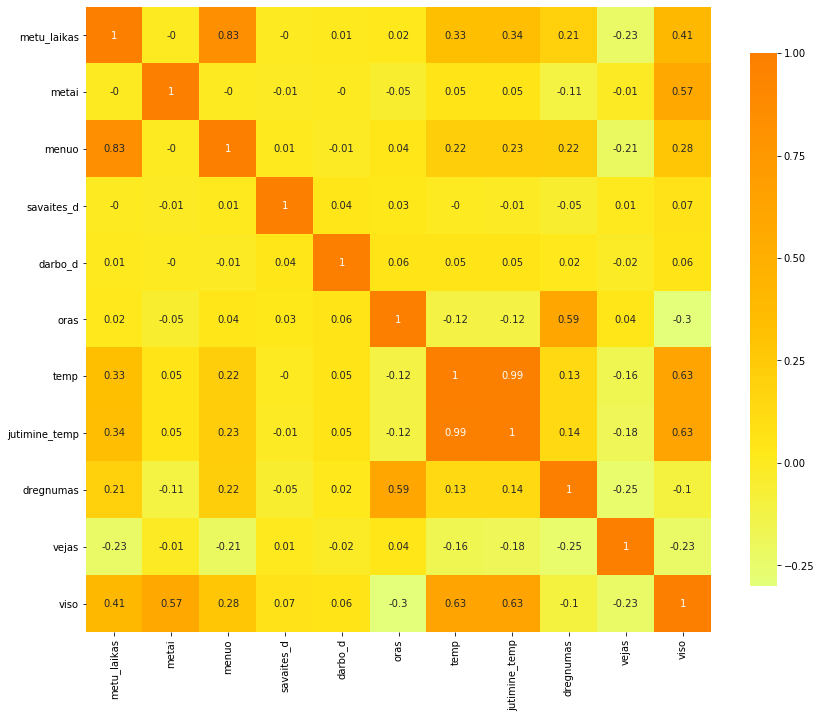

In [10]:
# Koreliacijos "heatmap'as"
f, ax = plt.subplots(figsize=(14, 14))
corr = df_d.corr().round(2)
sns.heatmap(corr, cmap = 'Wistia', annot= True, square=True, cbar_kws={"shrink": .7}, ax=ax)
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

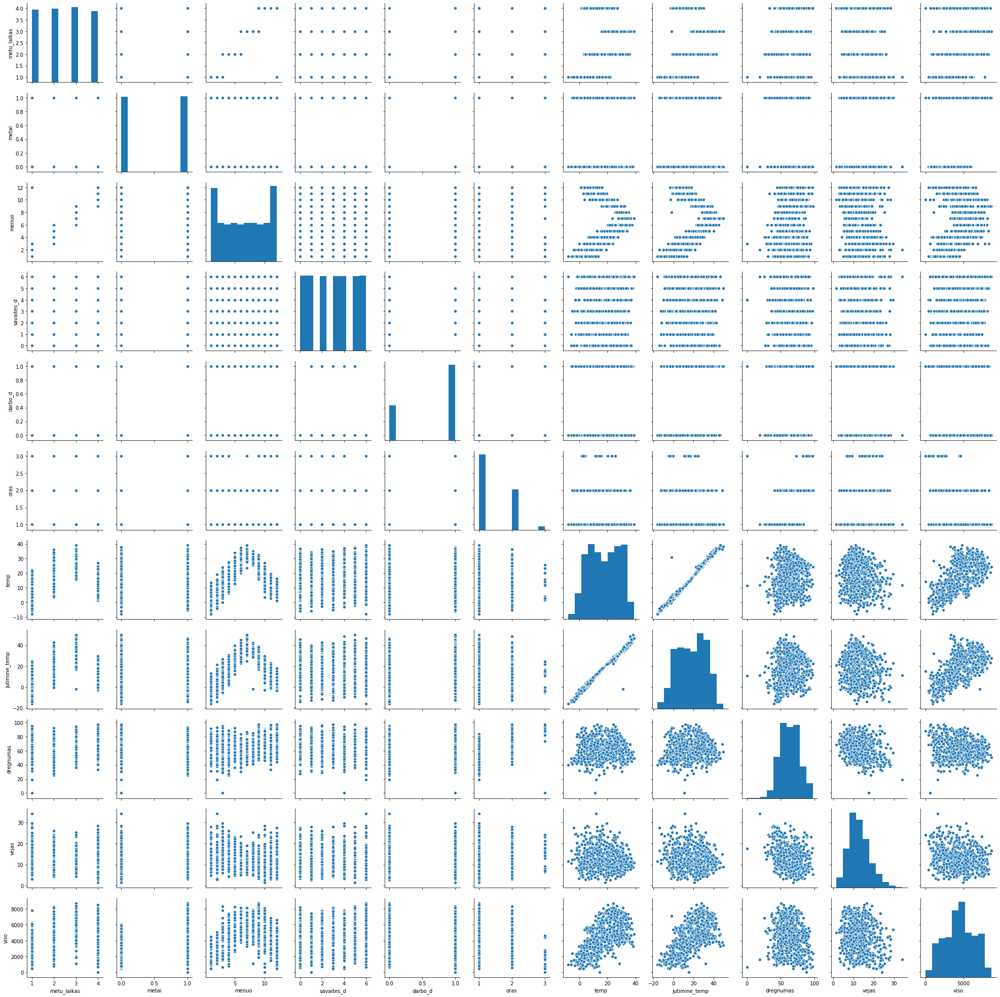

In [11]:
sns.pairplot(df_d)

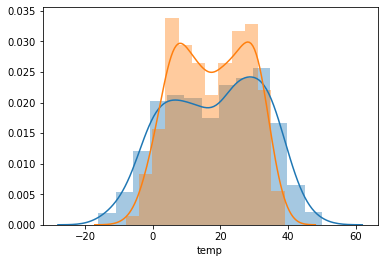

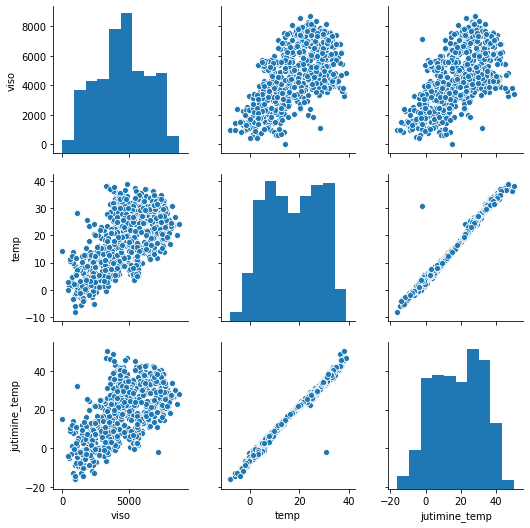

In [12]:
# Tiesinės regresijos analizės galimo pasirinkimo (jutiminės ir oro temperatūrų)
# bei viso išnuomotų dviračių kiekio duomenų pasiskirstymas

sns.distplot(df_d['jutimine_temp'])
sns.distplot(df_d['temp'])
sns.pairplot(df_d.loc[:,['viso','temp','jutimine_temp']])
plt.show()

Text(0, 0.5, 'Isnuomotu dviraciu skaicius')

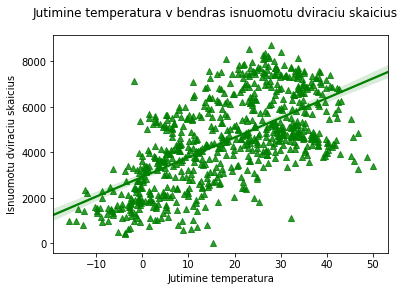

In [13]:
sns.regplot(x ='jutimine_temp', y ='viso', data = df_d , marker= '^',color = 'green')
plt.suptitle('Jutimine temperatura v bendras isnuomotu dviraciu skaicius')
plt.xlabel('Jutimine temperatura')
plt.ylabel('Isnuomotu dviraciu skaicius')

# **2. Tiesinė regresija**

In [14]:
# Pagrindinis modelis: modelis1

X = df_d[['jutimine_temp']]
y = df_d['viso']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 50)

modelis1 = LinearRegression()
modelis1.fit(X_train, y_train)
print(modelis1.score(X_test, y_test))

res = df_d[['jutimine_temp', 'viso']]
res['spejimas'] = modelis1.predict(X)
res


0.29136456044977344


,jutimine_temp,viso,spejimas
0,8.652147,985,3627.181819
1,7.795684,801,3549.509521
2,-6.441213,1349,2258.370598
3,-4.473150,1562,2436.853462
4,-2.987552,1600,2571.581822
5,-2.646301,1606,2602.529746
6,-4.757569,1510,2411.059597
7,-8.793410,959,2045.050696
8,-12.785414,822,1683.017334
9,-9.778091,1321,1955.750338


In [15]:
# modelis1 
res = df_d[['jutimine_temp', 'viso']]
res['regresija'] = modelis1.predict(df_d[['jutimine_temp']])
res['regresijos_paklaida'] = res['viso'] - res['regresija']
print(res['regresijos_paklaida'].sum())
print(abs(res['regresijos_paklaida']).mean())

5257.207542378979
1232.5414893991012


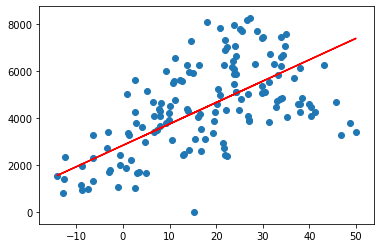

In [16]:
plt.plot(X_test[['jutimine_temp']], modelis1.predict(X_test[['jutimine_temp']]), c = 'red')
plt.scatter(X_test['jutimine_temp'], y_test)

In [17]:
train_set = X_train.copy()
train_set['viso'] = y_train

In [18]:
testas1 = smf.ols('viso ~ jutimine_temp', train_set).fit()
pred = testas1.get_prediction(X_test)
testas1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   viso   R-squared:                       0.422
Model:                            OLS   Adj. R-squared:                  0.421
Method:                 Least Squares   F-statistic:                     424.2
Date:                Tue, 18 Feb 2020   Prob (F-statistic):           3.30e-71
Time:                        18:21:31   Log-Likelihood:                -5094.1
No. Observations:                 584   AIC:                         1.019e+04
Df Residuals:                     582   BIC:                         1.020e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept      2842.5218    101.607     27.976      0.000    2642.961    3042.083
jutimine_temp    90.6896      4.403     20.596      0.000      82.041      99.338
==============================================================================
Omnibus:                       12.874   Durbin-Watson:                   1.909
Prob(Omnibus):                  0.002   Jarque-Bera (JB):                9.263
Skew:                           0.193   Prob(JB):                      0.00974
Kurtosis:                       2.519   Cond. No.                         38.1
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [37]:
print('RMSE:', np.sqrt(testas1.mse_resid))
print('RSE:', np.sqrt(testas1.scale))

RMSE: 1488.523339352087
RSE: 1488.523339352087


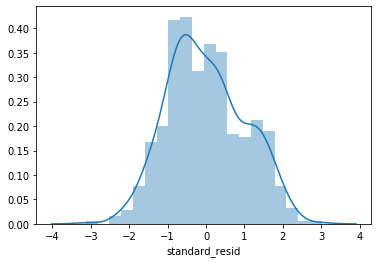

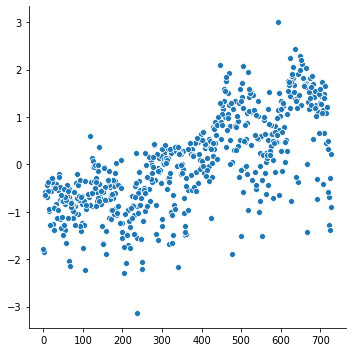

In [20]:
std_res = OLSInfluence(testas1).summary_frame()
sns.distplot(std_res['standard_resid'], bins=20)
sns.relplot(data=std_res['standard_resid'])

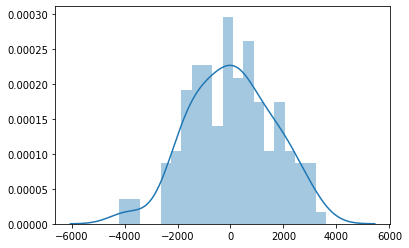

In [21]:
prediction = testas1.predict(X_test)
sns.distplot((y_test - prediction), bins=20)

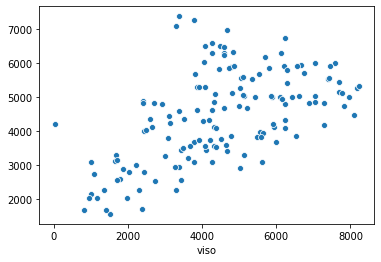

In [22]:
sns.scatterplot(x=y_test, y=prediction)

In [23]:
testas1.get_prediction(pd.DataFrame({'jutimine_temp': [1]})).summary_frame()

,mean,mean_se,mean_ci_lower,mean_ci_upper,obs_ci_lower,obs_ci_upper
0,2933.211439,98.141473,2740.456836,3125.966042,3.332092,5863.090786


^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

 ### Hipotezė: kuo aukštesnė jutiminė oro temperatūra, tuo daugiau žmonių nuomojasi dviračius ir jais važinėja.

Pasidalintų/paimtų dviračių kiekis statistiškai reikšmingai susijęs (p < 0.05) su jutimine oro temperatūra. Todėl su 95% tikimybe galime teigti, jog pasikeitus jutiminei oro temperatūrai vienu laipsniu, išnuomotų dviračių kiekis pasikeis vidutiniškai **91 vienetu.**

^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

In [24]:
# Visų jutiminę temperatūrą įtakojančių veiksnių (oro situacija, aplinkos temperatūra, santykinis oro drėgnumas, vėjo stiprumas)
# įvertinimas

X = df_d[['temp', 'dregnumas', 'vejas', 'oras']]
y = df_d['viso']
testas2 = smf.ols('viso ~ temp + dregnumas + vejas + oras', df_d).fit()
testas2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   viso   R-squared:                       0.472
Model:                            OLS   Adj. R-squared:                  0.469
Method:                 Least Squares   F-statistic:                     162.1
Date:                Tue, 18 Feb 2020   Prob (F-statistic):           4.25e-99
Time:                        18:22:02   Log-Likelihood:                -6336.4
No. Observations:                 731   AIC:                         1.268e+04
Df Residuals:                     726   BIC:                         1.271e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   5255.3919    316.926     16.582      0.000    4633.191    5877.592
temp         108.7865      5.083     21.400      0.000      98.806     118.767
dregnumas    -18.8184      4.942     -3.808      0.000     -28.520      -9.116
vejas        -62.8483     10.731     -5.857      0.000     -83.916     -41.781
oras        -484.7741    125.538     -3.862      0.000    -731.234    -238.314
==============================================================================
Omnibus:                       19.607   Durbin-Watson:                   0.376
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               12.727
Skew:                           0.185   Prob(JB):                      0.00172
Kurtosis:                       2.471   Cond. No.                         413.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [25]:
testas2.get_prediction(pd.DataFrame({'temp': [10], 'oras': [2], 'vejas': [10], 'dregnumas': [75]})).summary_frame()

,mean,mean_se,mean_ci_lower,mean_ci_upper,obs_ci_lower,obs_ci_upper
0,3333.847093,91.335287,3154.534284,3513.159903,556.235937,6111.45825


^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

#### *Pastebėjimas: Išnuomojamų dviračių skaičiui įtaką daro visi meteorologiniai veiksniai.* 

^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

# 2. Duomenų analizė pasitelkus Facebook sukurtą laiko eilučių analizės procedūrą Prophet

In [26]:
# Stulpelių pervadinimas

df_d['ds'] = df_d['data']
df_d['y'] = df_d['viso']

In [27]:
# Laiko eilučių dekompozicija

from random import randrange
from pandas import Series
from matplotlib import pyplot
from matplotlib.pyplot import figure
import matplotlib


from statsmodels.tsa.seasonal import seasonal_decompose
series = df_d['y']
result = seasonal_decompose(series, model='additive', freq=30)

<bound method Figure.show of <Figure size 432x288 with 4 Axes>>

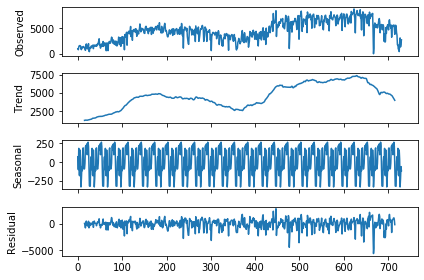

In [28]:
result.plot().show

In [29]:
# FBProphet importavimas

from fbprophet import Prophet
from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

In [30]:
# Modelis
m = Prophet()
m.fit(df_d)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [31]:
# Prognozavimas: prognozuojama mėnesiui (be sezoniškumo įvertinimų)

future = m.make_future_dataframe(periods=30)
future.tail()

,ds
756,2013-01-26
757,2013-01-27
758,2013-01-28
759,2013-01-29
760,2013-01-30


In [32]:
# Prognozavimas: prognozuojama mėnesiui (be sezoniškumo įvertinimų)

forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
756,2013-01-26,5508.332388,4201.562215,6687.508226
757,2013-01-27,5173.136956,3905.088717,6387.487245
758,2013-01-28,5267.744364,4020.332042,6494.540835
759,2013-01-29,5420.691773,4126.081448,6599.270847
760,2013-01-30,5444.441624,4342.583422,6694.121474


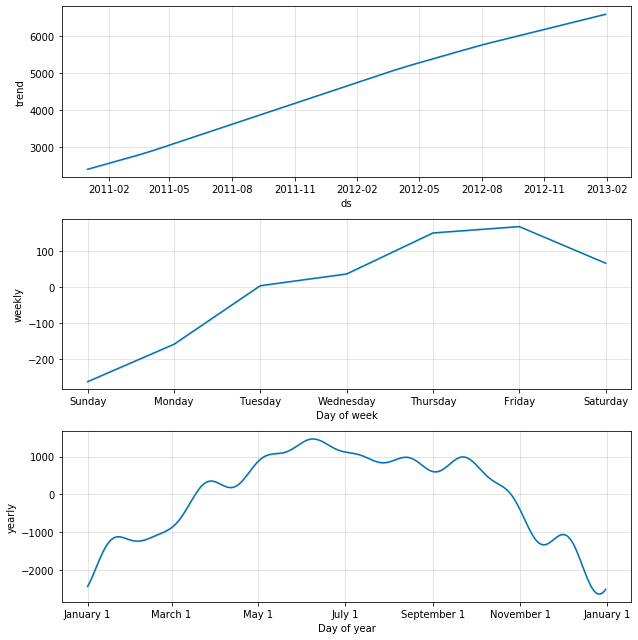

In [33]:
fig2 = m.plot_components(forecast)


In [34]:
# Prognozuojama mėnesiui (be sezoniškumo įvertinimų). Grafinis atvaizdavimas

import plotly.offline as py
import plotly.graph_objects as go
py.init_notebook_mode()
fig = plot_plotly(m, forecast)  # This returns a plotly Figure
py.iplot(fig)

In [35]:
# Modelyje įvertinamas mėnesinis sezoniškumas

from fbprophet.plot import plot_yearly
m = Prophet(growth='linear')
m.add_seasonality(name='monthly', period=30, fourier_order=5)
m.fit(df_d)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [36]:
# Prognuozojama atsižvelgiant ir į metinį nuomos augimą lygų 1.5 karto
# Grafinis atvaizdavimas

df_d['cap'] = 1.5
future = m.make_future_dataframe(periods=365)
future['cap'] = 1.5
forecast = m.predict(future)

py.init_notebook_mode()
fig = plot_plotly(m, forecast) 
py.iplot(fig)


▼▼▼▼▼▼▼▼▼▼▼▼▼▼▼

# Dėkoju už dėmesį.